In [1]:
import matplotlib.pyplot as plt
from torchvision import transforms
import torch
from torch import nn
from torch.utils.data import DataLoader, random_split
from tqdm import tqdm
import numpy as np

from dataset import SatelliteImageDataset
from unet import UNet
from utils import (
    one_hot_to_image,
    plot_prediction,
    compute_accuracy,
    image_to_class_index,
    class_index_to_one_hot,
    class_index_to_image,
    get_color_patches
)

In [2]:
transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((512, 512)),
        transforms.ToTensor()
    ])

In [3]:
dataset = SatelliteImageDataset(
    image_dir='data/images',
    mask_dir='data/masks',
    transform=transform
)

In [4]:
train_set, test_set = random_split(dataset, [0.8, 0.2])

In [5]:
img, mask = dataset[0]

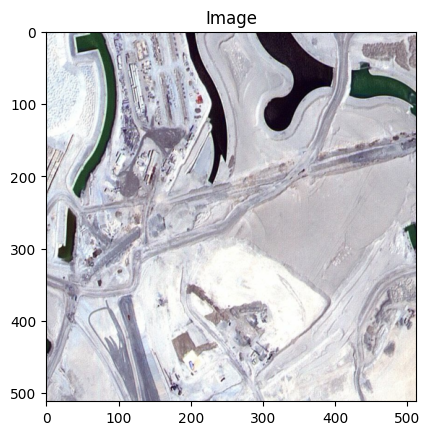

In [6]:
plt.imshow(img.permute(1, 2, 0))
plt.title('Image')
plt.show()

In [7]:
mask_labels = ['building', 'land', 'road', 'vegetation', 'water', 'unlabeled']

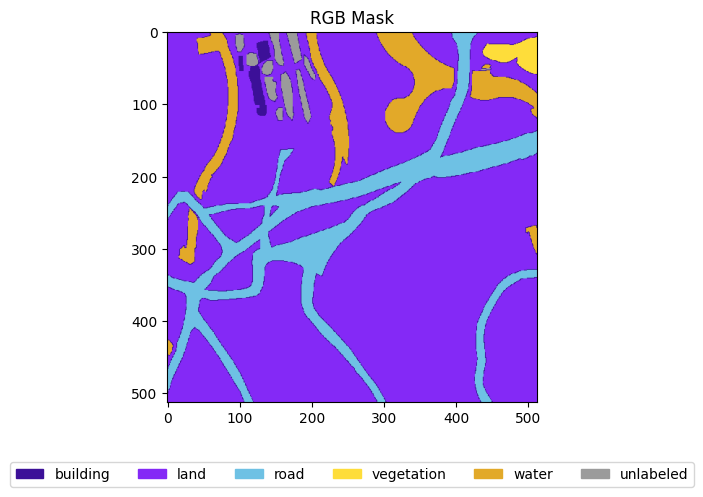

In [8]:
mask_rgb = class_index_to_image(torch.unsqueeze(mask, 0), dataset.color_map)[0]
plt.imshow(mask_rgb.permute(1, 2, 0))

patches = get_color_patches(dataset.color_map, mask_labels)
plt.legend(handles=patches, loc='lower center', bbox_to_anchor=(0.5, -0.25), fontsize=10, ncol=6)

plt.title('RGB Mask')
plt.show()

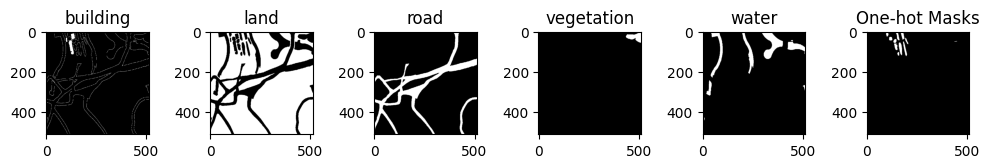

In [9]:
fig, axes = plt.subplots(1, 6, figsize=(10, 8))
mask = class_index_to_one_hot(mask, dataset.color_map)

for i in range(6):
    axes[i].imshow(mask[i], cmap='gray')
    axes[i].set_title(mask_labels[i])

plt.title('One-hot Masks')
plt.tight_layout()
plt.show()

In [10]:
train_loader = DataLoader(train_set, batch_size=1, shuffle=True)
test_loader = DataLoader(test_set, batch_size=1)

In [11]:
LEARNING_RATE = 3e-4
EPOCHS = 100

In [12]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = UNet(in_channels=3, out_channels=6).to(device)

In [13]:
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
criterion = torch.nn.CrossEntropyLoss().to(device)

Epoch 1:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


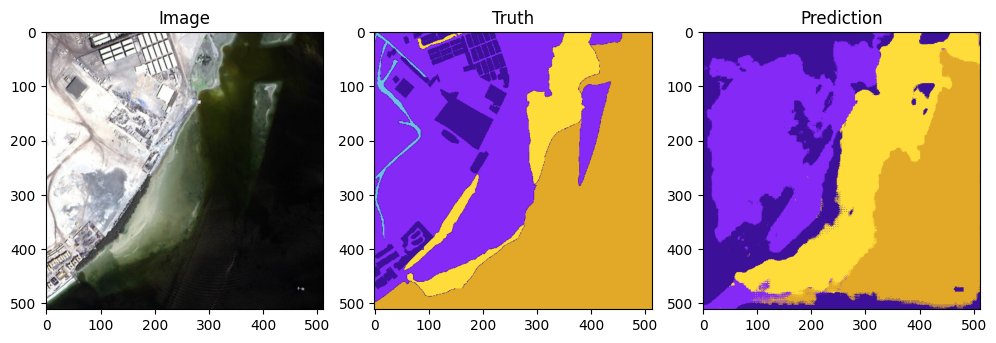

Accuracy: 0.4699 | Loss: 0.4968


Epoch 2:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


Accuracy: 0.5523 | Loss: 0.4270


Epoch 3:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


Accuracy: 0.5682 | Loss: 0.4149


Epoch 4:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


Accuracy: 0.5916 | Loss: 0.3935


Epoch 5:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.63it/s]


Accuracy: 0.6021 | Loss: 0.3689


Epoch 6:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.6214 | Loss: 0.3547


Epoch 7:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.6372 | Loss: 0.3402


Epoch 8:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


Accuracy: 0.6534 | Loss: 0.3290


Epoch 9:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.6720 | Loss: 0.3206


Epoch 10:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


Accuracy: 0.6880 | Loss: 0.3145


Epoch 11:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


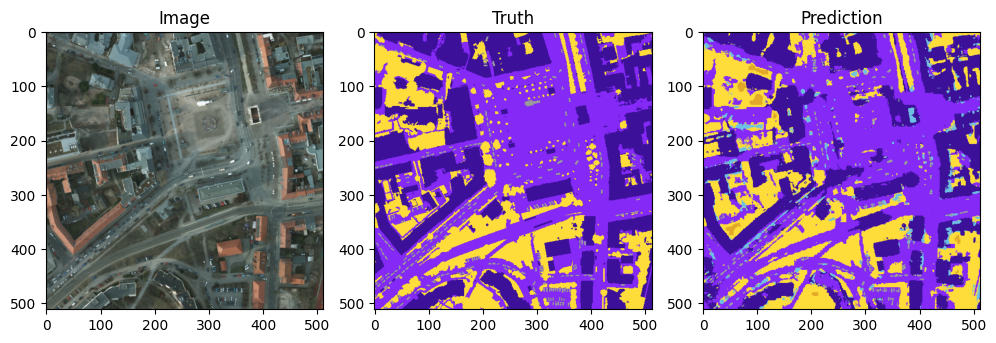

Accuracy: 0.7041 | Loss: 0.3099


Epoch 12:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


Accuracy: 0.7154 | Loss: 0.3019


Epoch 13:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.65it/s]


Accuracy: 0.7223 | Loss: 0.2944


Epoch 14:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


Accuracy: 0.7367 | Loss: 0.2900


Epoch 15:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


Accuracy: 0.7442 | Loss: 0.2838


Epoch 16:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.7507 | Loss: 0.2804


Epoch 17:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.7612 | Loss: 0.2706


Epoch 18:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.7654 | Loss: 0.2689


Epoch 19:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.7738 | Loss: 0.2639


Epoch 20:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.7888 | Loss: 0.2561


Epoch 21:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.63it/s]


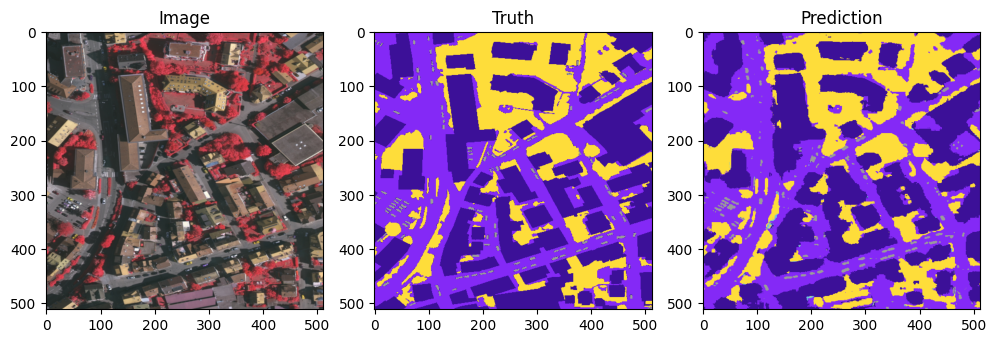

Accuracy: 0.7849 | Loss: 0.2577


Epoch 22:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.7866 | Loss: 0.2544


Epoch 23:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.63it/s]


Accuracy: 0.7941 | Loss: 0.2511


Epoch 24:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


Accuracy: 0.8046 | Loss: 0.2425


Epoch 25:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.7982 | Loss: 0.2491


Epoch 26:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


Accuracy: 0.8128 | Loss: 0.2363


Epoch 27:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.8191 | Loss: 0.2304


Epoch 28:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.66it/s]


Accuracy: 0.8196 | Loss: 0.2279


Epoch 29:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.65it/s]


Accuracy: 0.8154 | Loss: 0.2303


Epoch 30:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


Accuracy: 0.8124 | Loss: 0.2347


Epoch 31:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


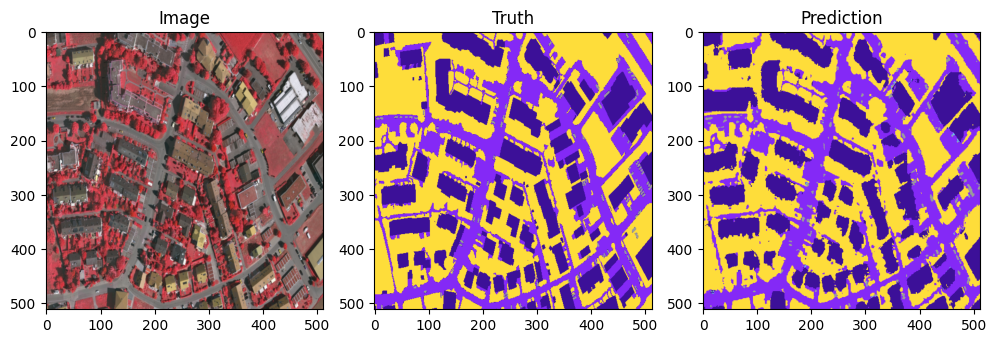

Accuracy: 0.8248 | Loss: 0.2230


Epoch 32:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


Accuracy: 0.8242 | Loss: 0.2199


Epoch 33:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


Accuracy: 0.8344 | Loss: 0.2137


Epoch 34:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.63it/s]


Accuracy: 0.8328 | Loss: 0.2132


Epoch 35:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


Accuracy: 0.8367 | Loss: 0.2110


Epoch 36:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.8396 | Loss: 0.2071


Epoch 37:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.63it/s]


Accuracy: 0.8387 | Loss: 0.2054


Epoch 38:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.63it/s]


Accuracy: 0.8402 | Loss: 0.2054


Epoch 39:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.8474 | Loss: 0.1968


Epoch 40:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


Accuracy: 0.8517 | Loss: 0.1899


Epoch 41:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


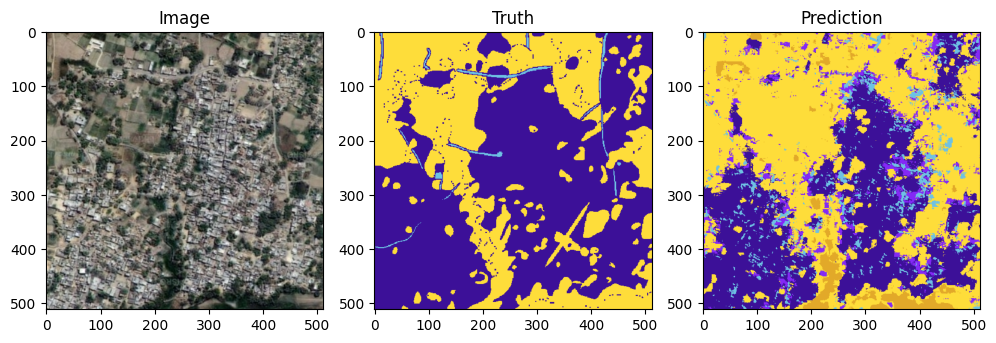

Accuracy: 0.8371 | Loss: 0.2076


Epoch 42:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8389 | Loss: 0.2084


Epoch 43:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8506 | Loss: 0.1923


Epoch 44:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8553 | Loss: 0.1877


Epoch 45:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.61it/s]


Accuracy: 0.8536 | Loss: 0.1902


Epoch 46:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8555 | Loss: 0.1862


Epoch 47:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.61it/s]


Accuracy: 0.8564 | Loss: 0.1856


Epoch 48:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8573 | Loss: 0.1823


Epoch 49:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8594 | Loss: 0.1813


Epoch 50:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8509 | Loss: 0.1902


Epoch 51:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.63it/s]


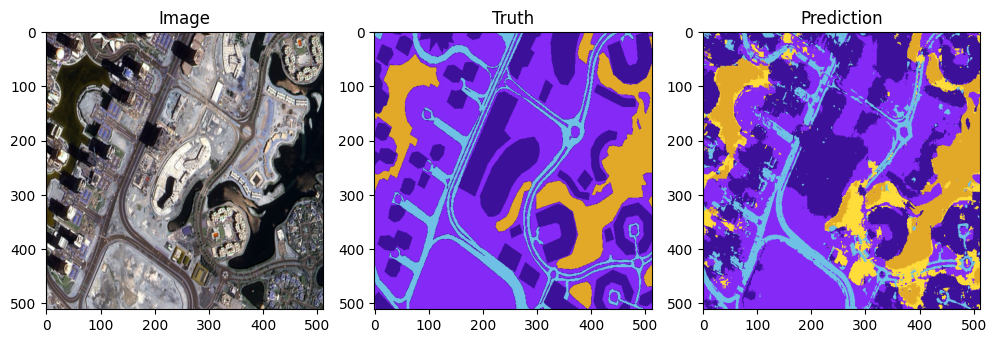

Accuracy: 0.8441 | Loss: 0.1954


Epoch 52:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.63it/s]


Accuracy: 0.8515 | Loss: 0.1930


Epoch 53:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8597 | Loss: 0.1816


Epoch 54:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.8616 | Loss: 0.1797


Epoch 55:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.8646 | Loss: 0.1750


Epoch 56:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


Accuracy: 0.8649 | Loss: 0.1750


Epoch 57:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.8689 | Loss: 0.1713


Epoch 58:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8666 | Loss: 0.1729


Epoch 59:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.8709 | Loss: 0.1681


Epoch 60:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8702 | Loss: 0.1674


Epoch 61:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


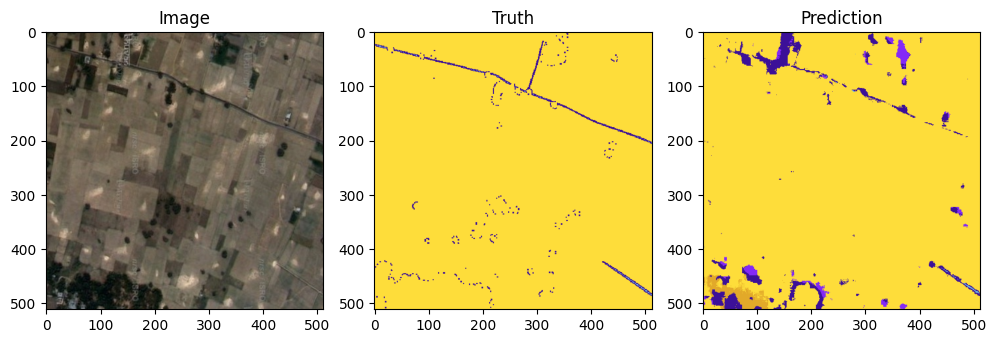

Accuracy: 0.8731 | Loss: 0.1653


Epoch 62:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.63it/s]


Accuracy: 0.8661 | Loss: 0.1707


Epoch 63:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8610 | Loss: 0.1785


Epoch 64:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.63it/s]


Accuracy: 0.8738 | Loss: 0.1631


Epoch 65:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8739 | Loss: 0.1622


Epoch 66:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8790 | Loss: 0.1574


Epoch 67:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.8795 | Loss: 0.1577


Epoch 68:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8785 | Loss: 0.1585


Epoch 69:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.8753 | Loss: 0.1626


Epoch 70:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8712 | Loss: 0.1685


Epoch 71:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.64it/s]


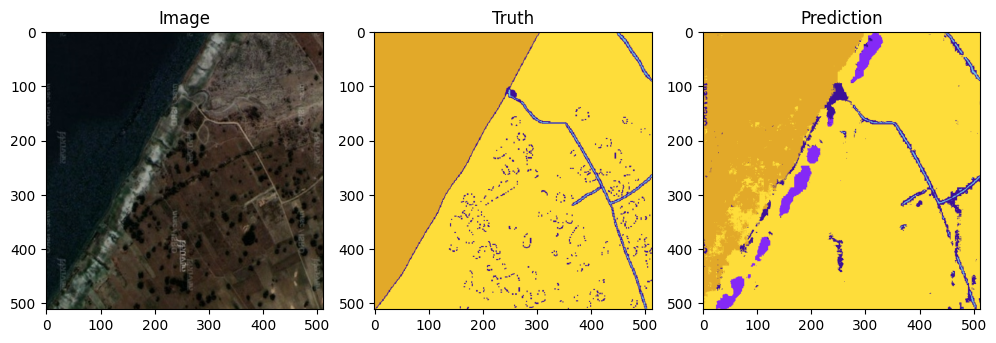

Accuracy: 0.8523 | Loss: 0.1879


Epoch 72:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.63it/s]


Accuracy: 0.8762 | Loss: 0.1615


Epoch 73:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.63it/s]


Accuracy: 0.8833 | Loss: 0.1527


Epoch 74:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8831 | Loss: 0.1538


Epoch 75:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8809 | Loss: 0.1553


Epoch 76:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8844 | Loss: 0.1514


Epoch 77:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8865 | Loss: 0.1495


Epoch 78:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8800 | Loss: 0.1558


Epoch 79:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8519 | Loss: 0.1893


Epoch 80:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.8737 | Loss: 0.1634


Epoch 81:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


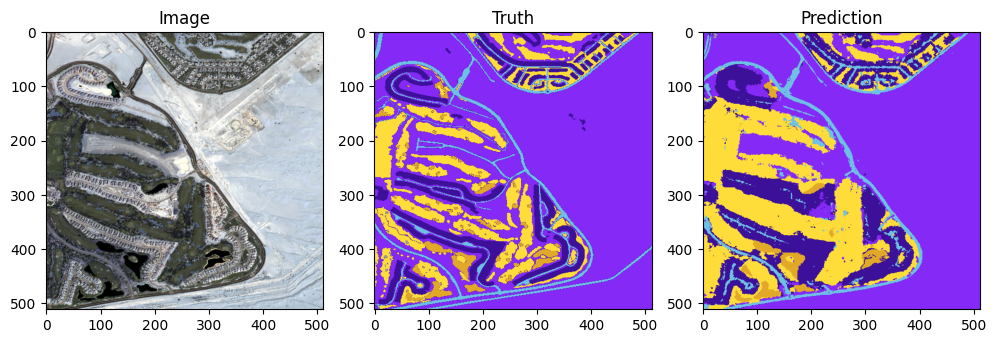

Accuracy: 0.8853 | Loss: 0.1497


Epoch 82:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8882 | Loss: 0.1460


Epoch 83:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8913 | Loss: 0.1430


Epoch 84:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8915 | Loss: 0.1424


Epoch 85:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8926 | Loss: 0.1411


Epoch 86:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8928 | Loss: 0.1417


Epoch 87:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8913 | Loss: 0.1436


Epoch 88:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8872 | Loss: 0.1476


Epoch 89:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8907 | Loss: 0.1430


Epoch 90:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8911 | Loss: 0.1437


Epoch 91:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


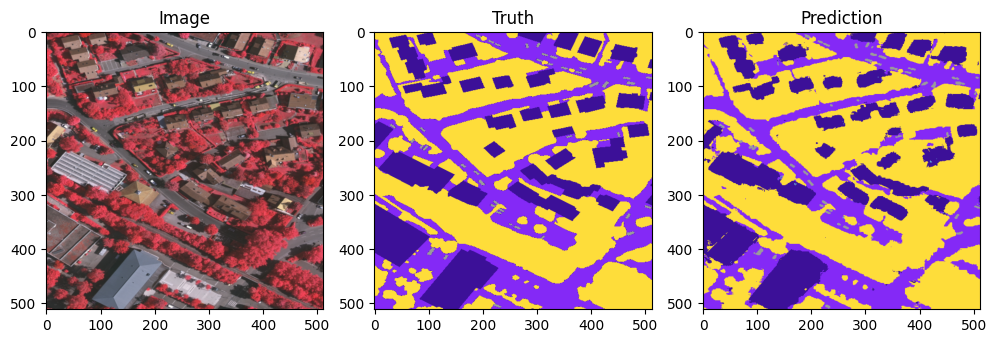

Accuracy: 0.8750 | Loss: 0.1640


Epoch 92:


Training: 100%|██████████| 163/163 [01:01<00:00,  2.63it/s]


Accuracy: 0.8819 | Loss: 0.1518


Epoch 93:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.63it/s]


Accuracy: 0.8925 | Loss: 0.1419


Epoch 94:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8957 | Loss: 0.1377


Epoch 95:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.63it/s]


Accuracy: 0.8978 | Loss: 0.1347


Epoch 96:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8986 | Loss: 0.1350


Epoch 97:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8994 | Loss: 0.1342


Epoch 98:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8929 | Loss: 0.1417


Epoch 99:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]


Accuracy: 0.8969 | Loss: 0.1375


Epoch 100:


Training: 100%|██████████| 163/163 [01:02<00:00,  2.62it/s]

Accuracy: 0.8905 | Loss: 0.1443




In [14]:
# Cross Entropy training

loss_list = []
acc_list = []

for epoch in range(EPOCHS):
    print(f'Epoch {epoch + 1}:')

    model.train()
    running_loss = 0
    running_acc = 0

    for x, y in tqdm(train_loader, desc='Training', colour='#00FF00'):
        x, y = x.to(device), y.to(device) # y: (b, h, w)
        y_pred = model(x) # y_pred: (b, 6, h, w)

        loss = criterion(y_pred, y)
        running_loss += loss.item()

        # compute the accuracy of the prediction
        running_acc += compute_accuracy(y, y_pred, device)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    if epoch % 10 == 0:
        # show first image in the last batch with matplotlib
        y_imgs = class_index_to_image(y, dataset.color_map, device)
        pred_imgs = one_hot_to_image(y_pred, dataset.color_map, device)
        plot_prediction(x, y_imgs, pred_imgs, dataset.color_map, mask_labels)

    epoch_acc = running_acc / len(train_loader)
    epoch_loss = running_loss / len(train_loader)
    acc_list.append(epoch_acc)
    loss_list.append(epoch_loss)

    print(f'Accuracy: {epoch_acc:.4f} | Loss: {epoch_loss:.4f}')
    print('\n')


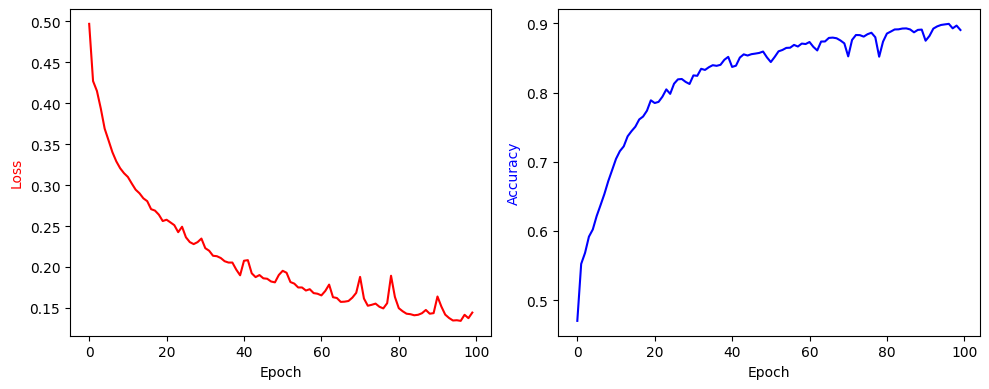

In [15]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].plot(loss_list, color='red')
axes[0].set_ylabel('Loss', color='red')
axes[0].set_xlabel('Epoch')

axes[1].plot(acc_list, color='blue')
axes[1].set_ylabel('Accuracy', color='blue')
axes[1].set_xlabel('Epoch')

plt.tight_layout()
plt.show()

In [16]:
checkpoint = {
    'epoch': epoch,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss_list': loss_list,
    'acc_list': acc_list
}

In [17]:
torch.save(checkpoint, 'unet/unet_100ep_checkpoint.pth')

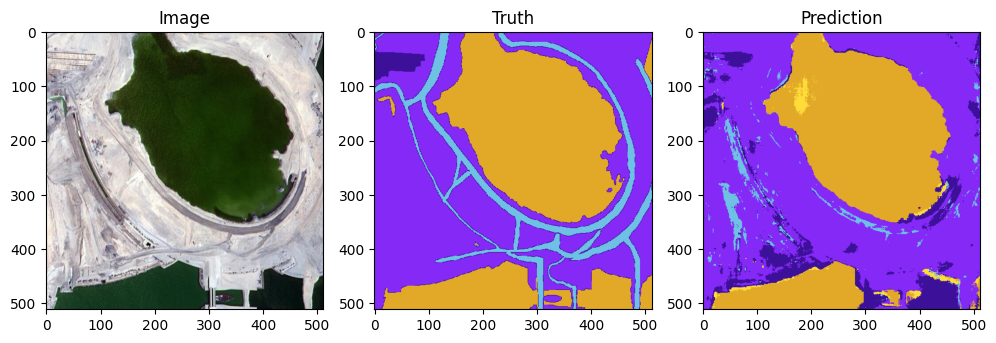

Accuracy: 0.7749 | Loss: 0.4936




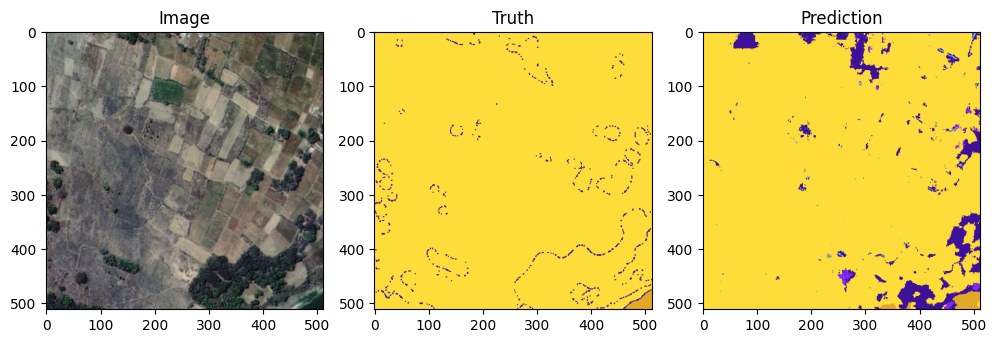

Accuracy: 0.9237 | Loss: 0.2165




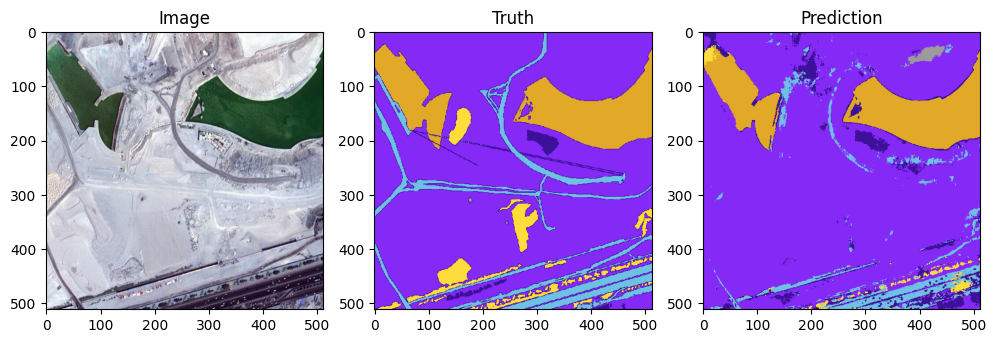

Accuracy: 0.8149 | Loss: 0.5488




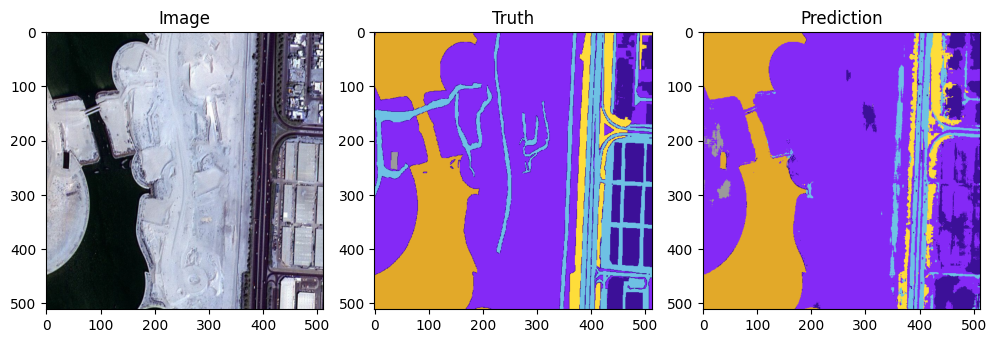

Accuracy: 0.7958 | Loss: 0.4091




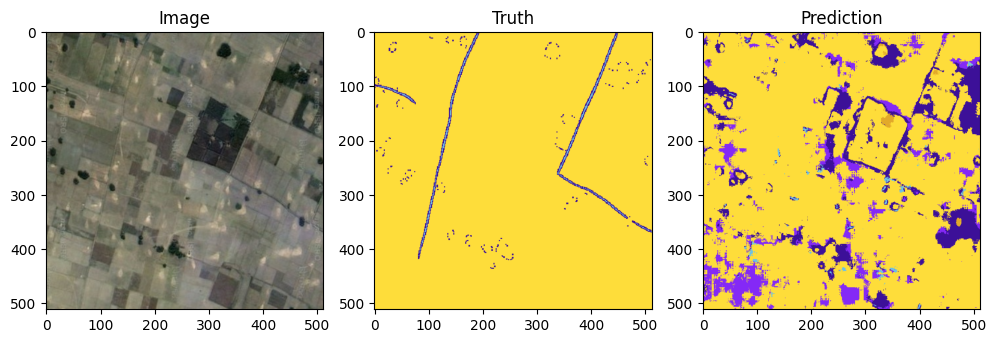

Accuracy: 0.8027 | Loss: 0.3287




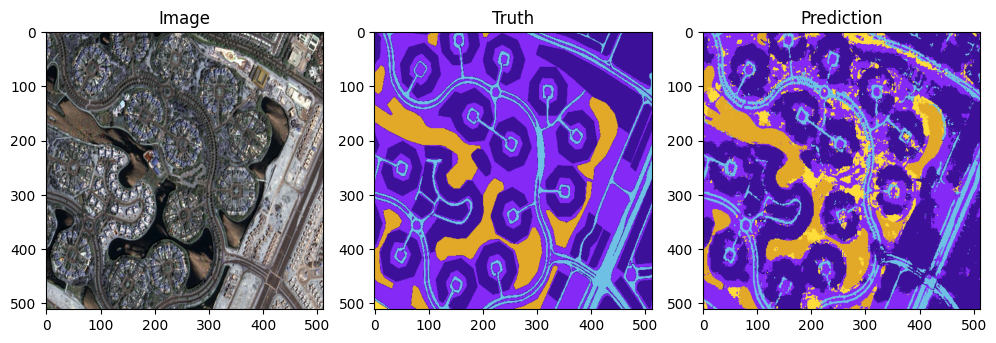

Accuracy: 0.6993 | Loss: 0.3365




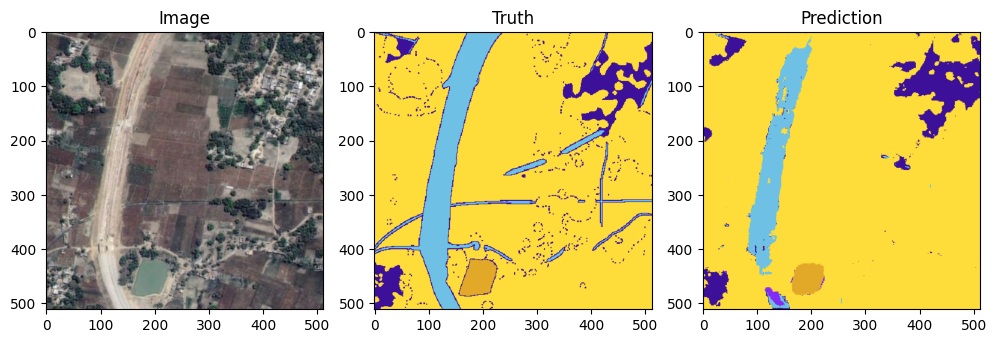

Accuracy: 0.8941 | Loss: 0.1397




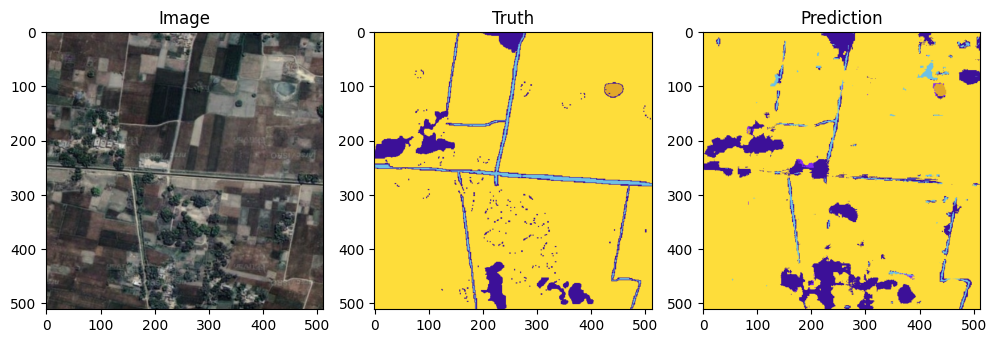

Accuracy: 0.9123 | Loss: 0.2432




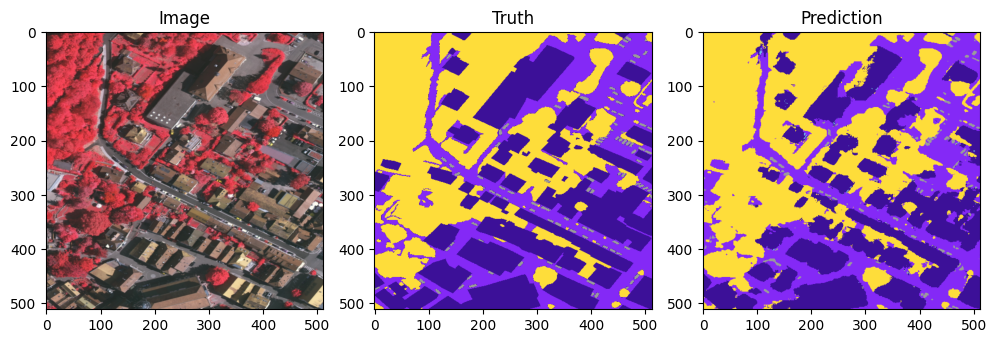

Accuracy: 0.8669 | Loss: 0.1533




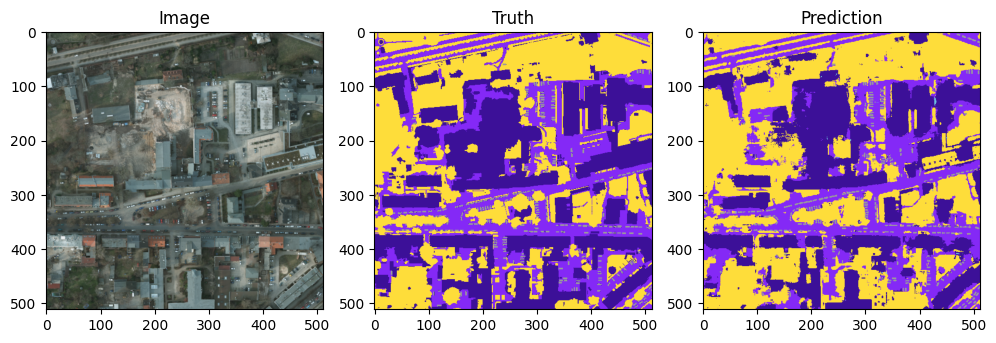

Accuracy: 0.7822 | Loss: 0.1522




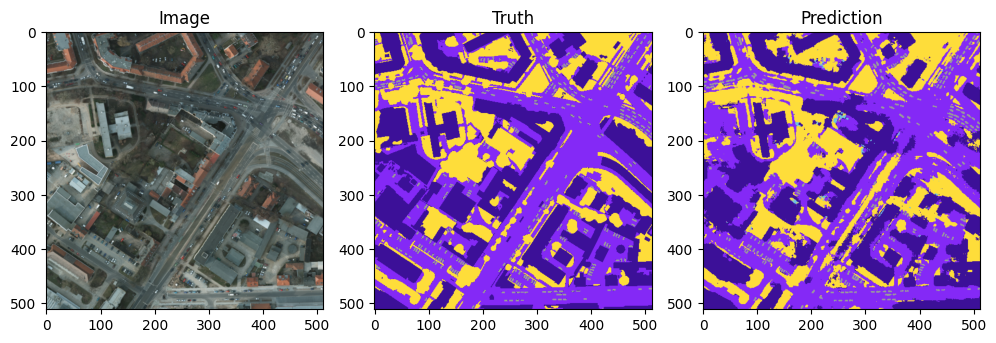

Accuracy: 0.7742 | Loss: 0.1534




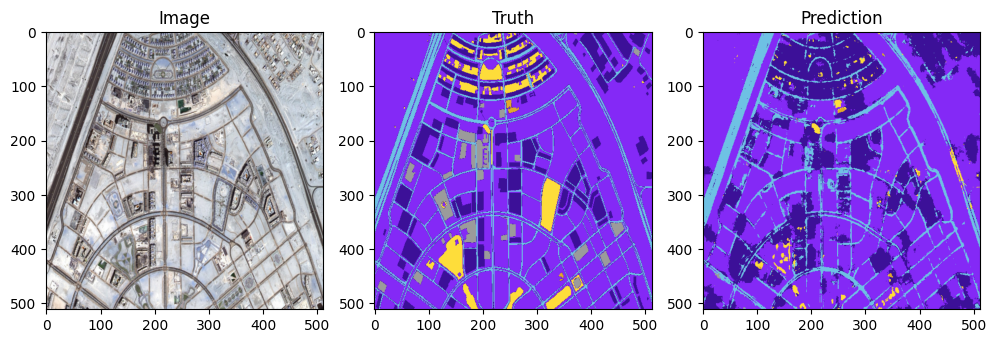

Accuracy: 0.7323 | Loss: 0.5305




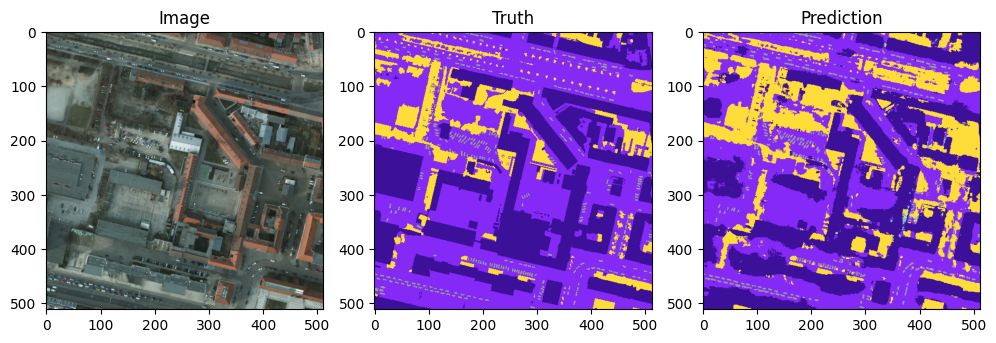

Accuracy: 0.7585 | Loss: 0.1763




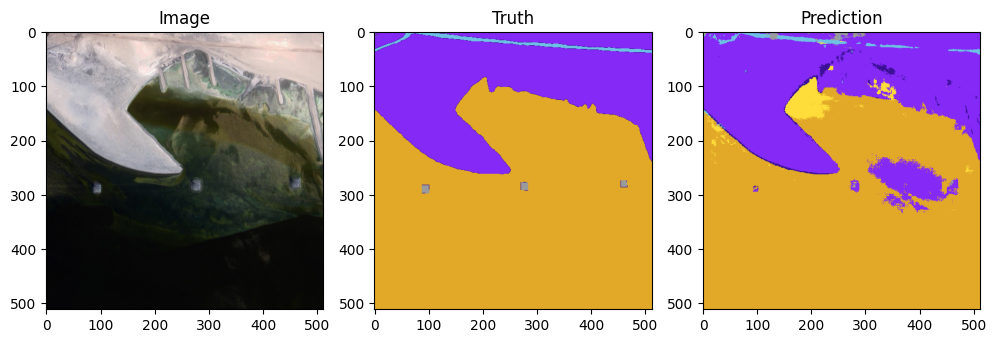

Accuracy: 0.9206 | Loss: 0.3816




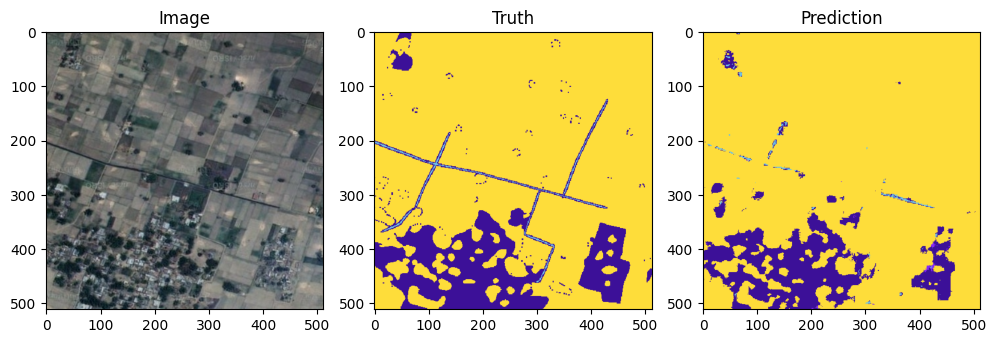

Accuracy: 0.9167 | Loss: 0.1810




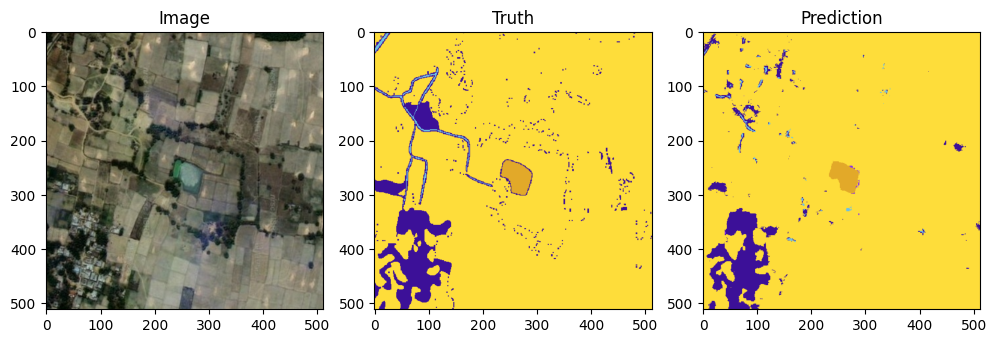

Accuracy: 0.9421 | Loss: 0.2178




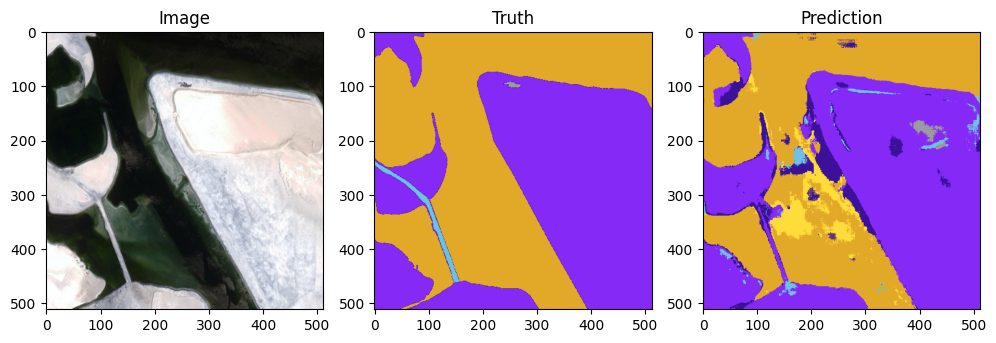

Accuracy: 0.8722 | Loss: 0.5102




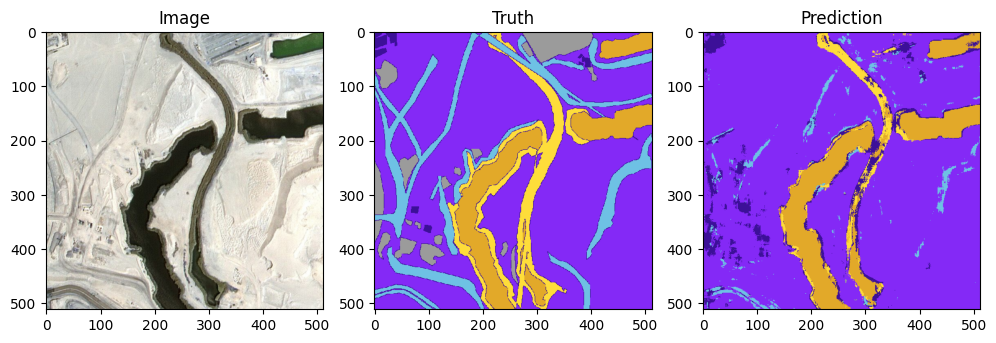

Accuracy: 0.7288 | Loss: 0.5765




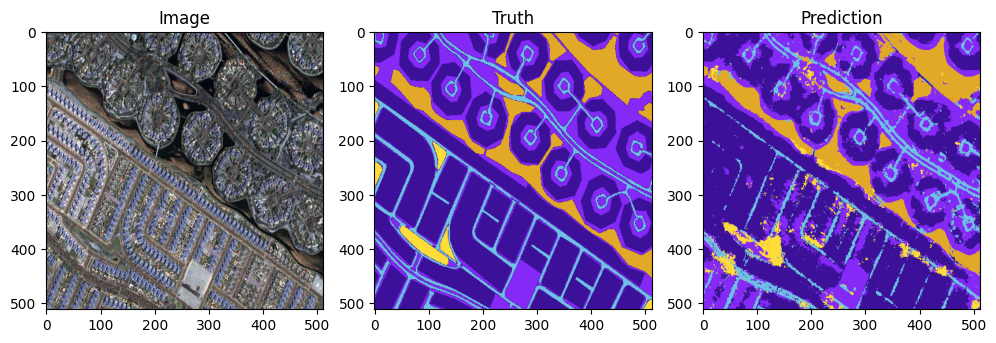

Accuracy: 0.7384 | Loss: 0.2988




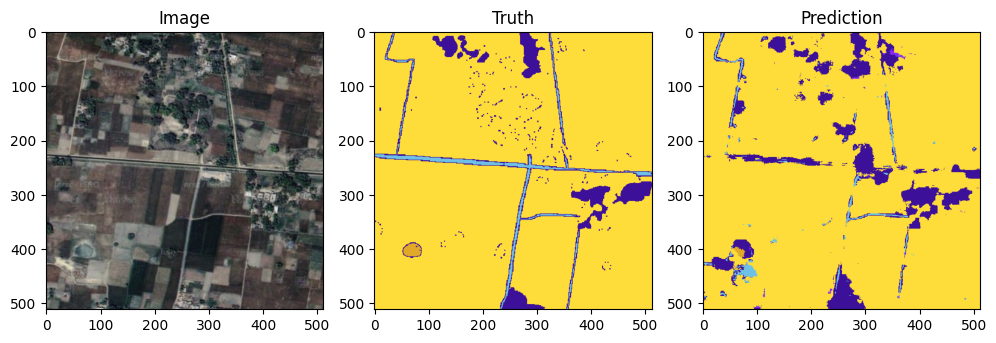

Accuracy: 0.9105 | Loss: 0.2930




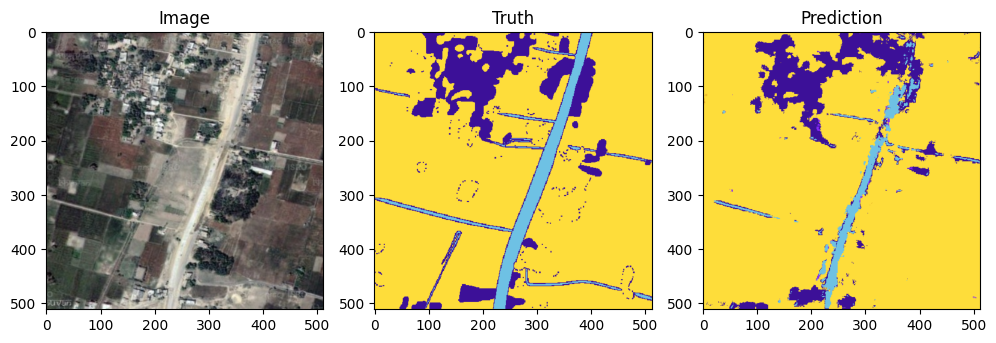

Accuracy: 0.8835 | Loss: 0.1451




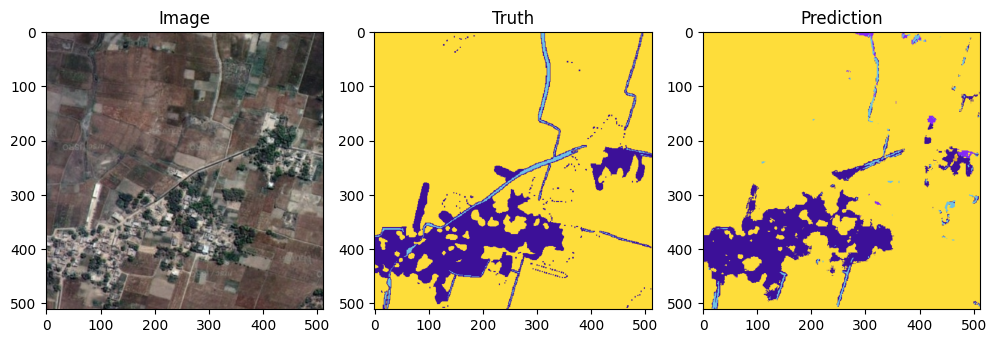

Accuracy: 0.9188 | Loss: 0.1551




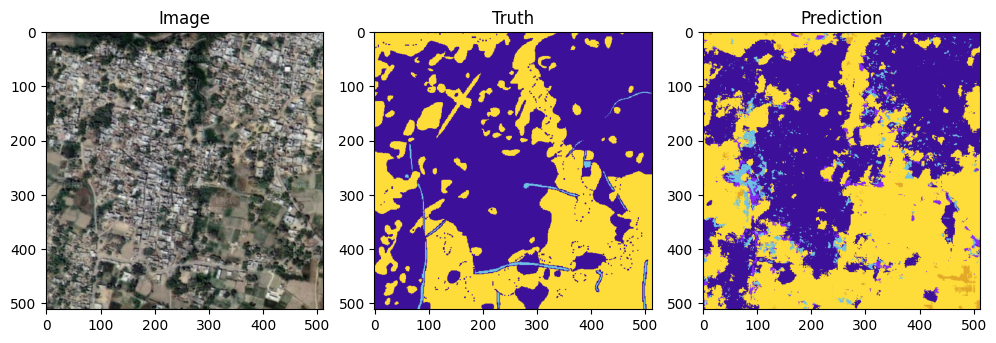

Accuracy: 0.7511 | Loss: 0.2376




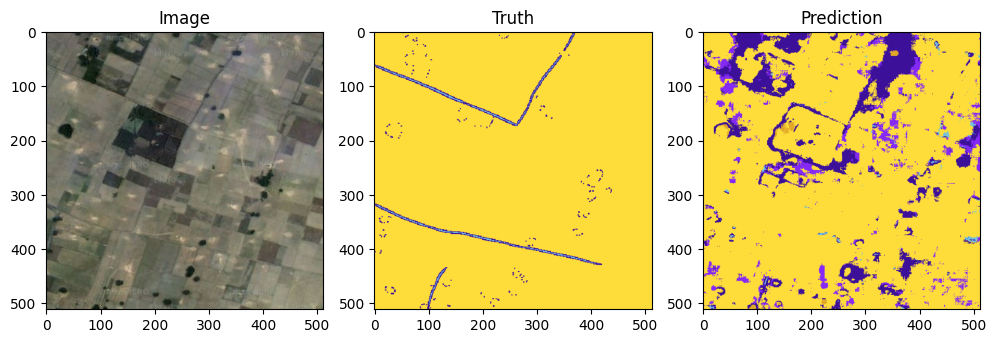

Accuracy: 0.8244 | Loss: 0.3259




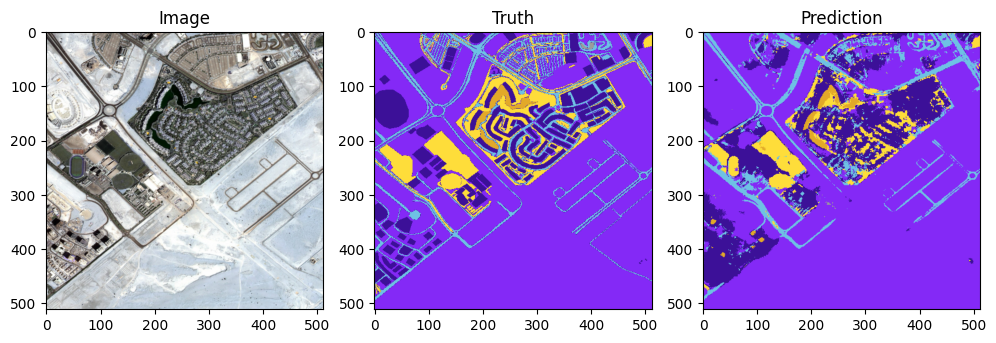

Accuracy: 0.7754 | Loss: 0.4500




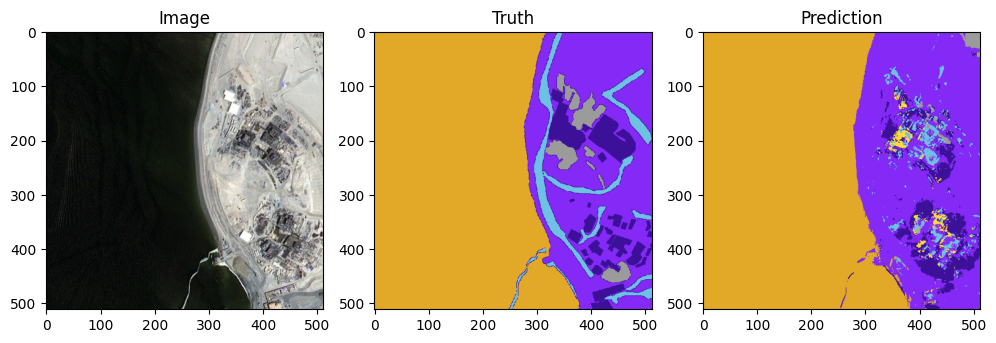

Accuracy: 0.8376 | Loss: 0.4724




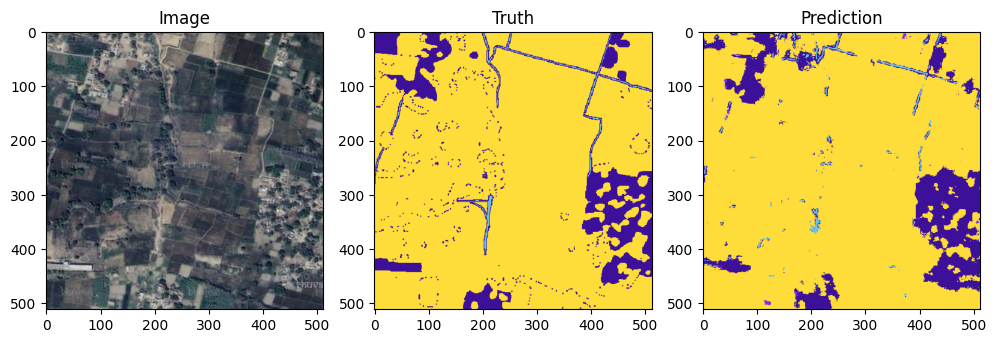

Accuracy: 0.9097 | Loss: 0.1725




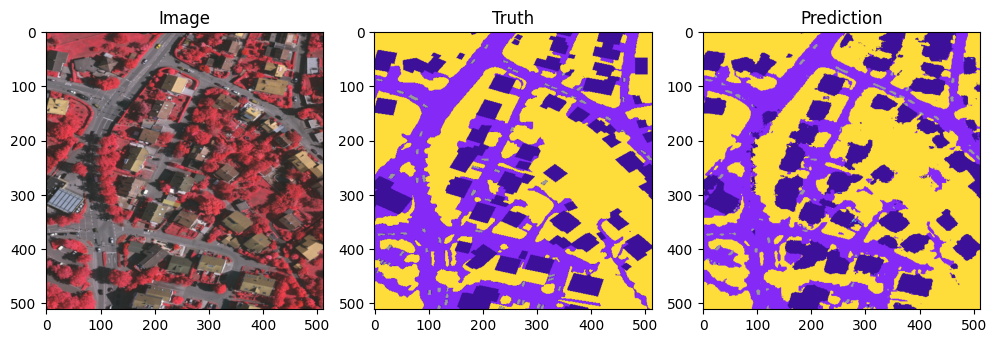

Accuracy: 0.8813 | Loss: 0.1348




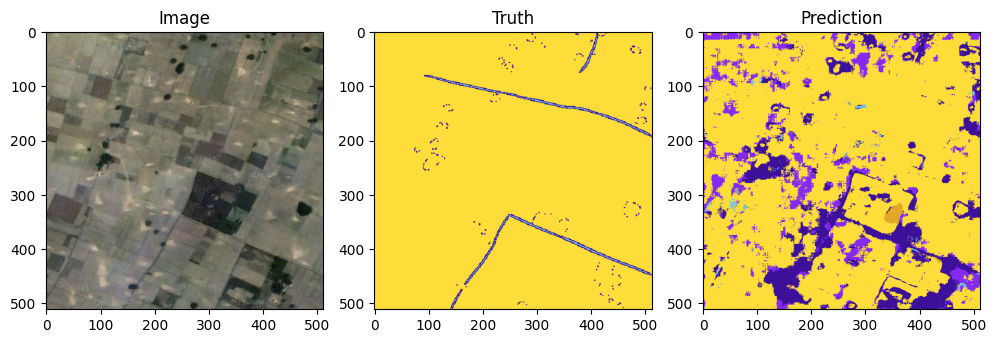

Accuracy: 0.7802 | Loss: 0.3304




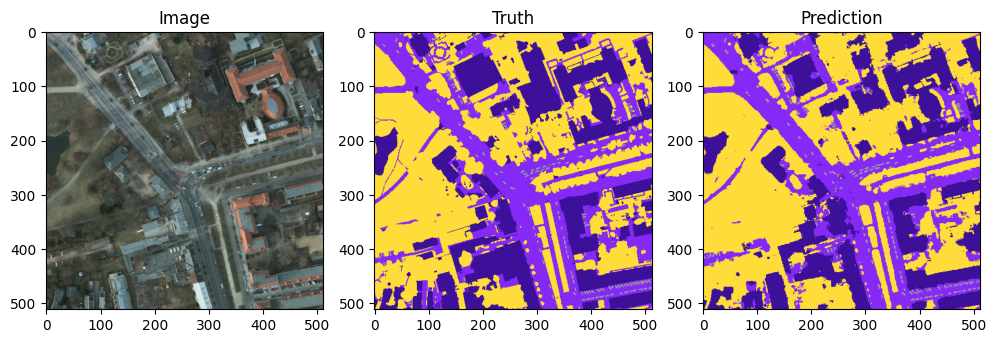

Accuracy: 0.8438 | Loss: 0.1272




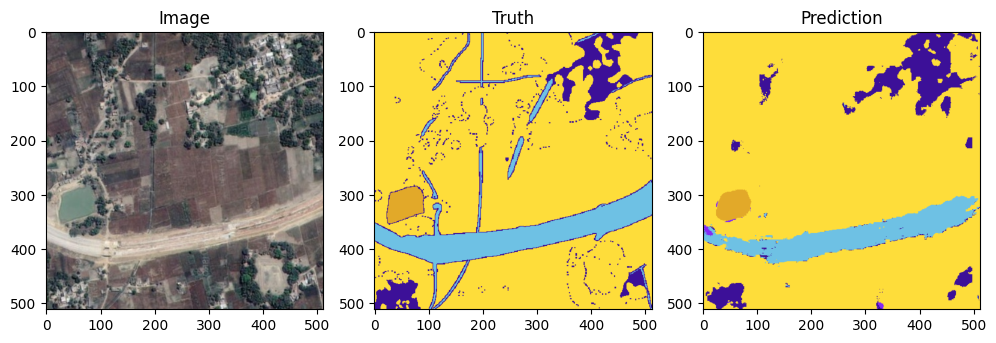

Accuracy: 0.9038 | Loss: 0.1263




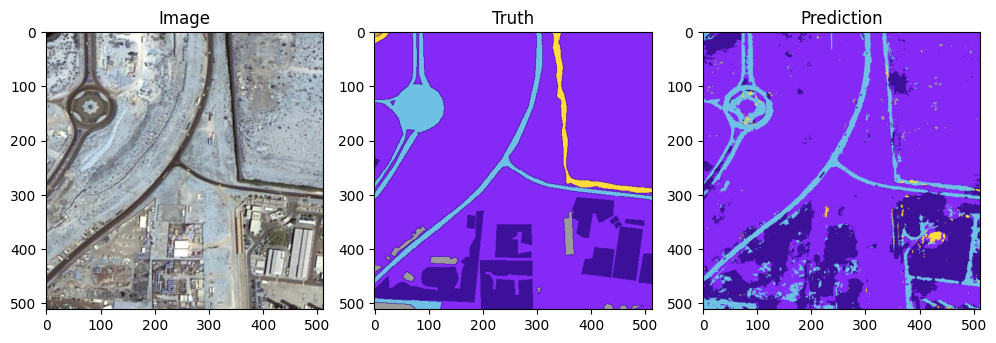

Accuracy: 0.7955 | Loss: 0.6376




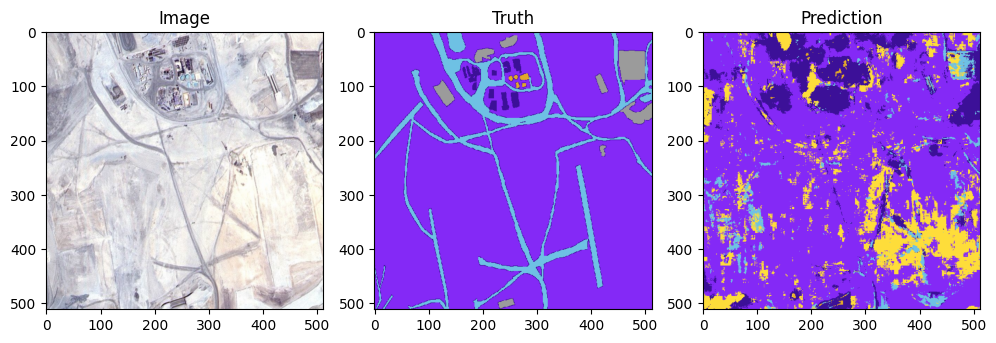

Accuracy: 0.6242 | Loss: 0.6416




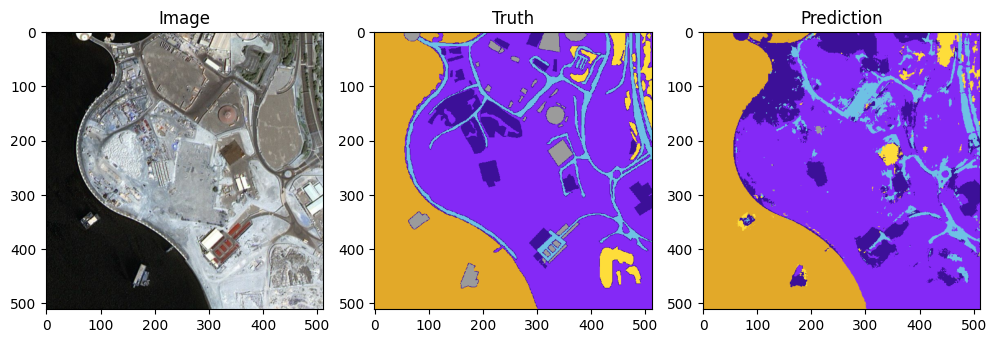

Accuracy: 0.7842 | Loss: 0.4908




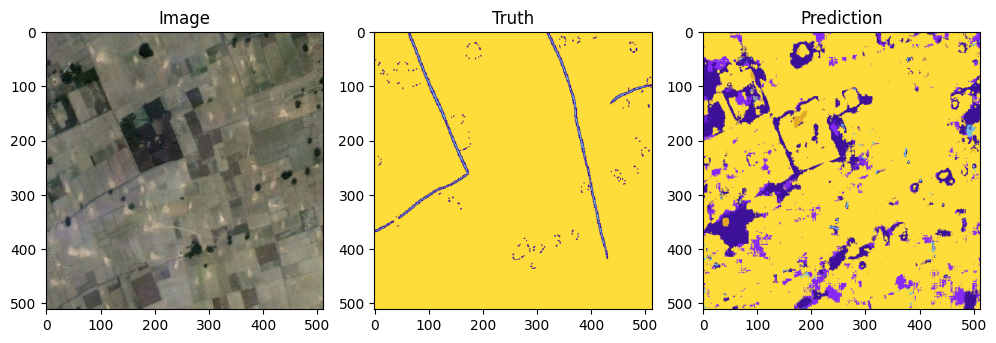

Accuracy: 0.8184 | Loss: 0.3289




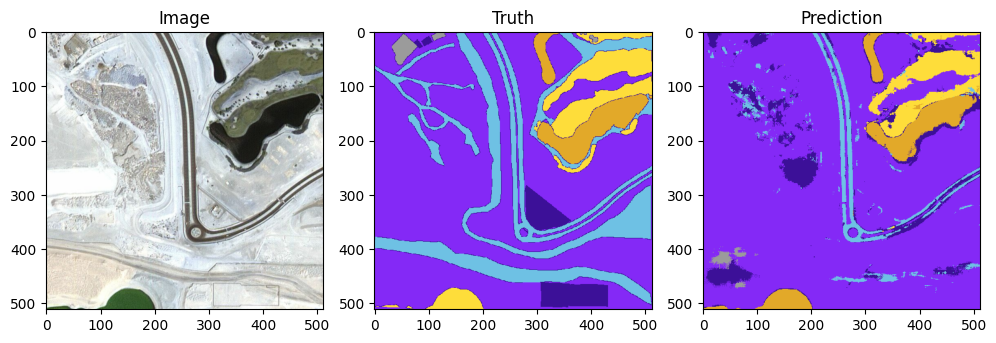

Accuracy: 0.6912 | Loss: 0.5390




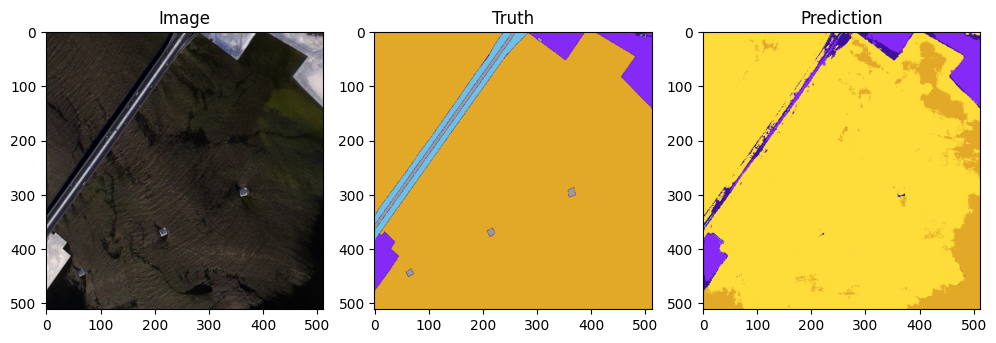

Accuracy: 0.1389 | Loss: 0.6296




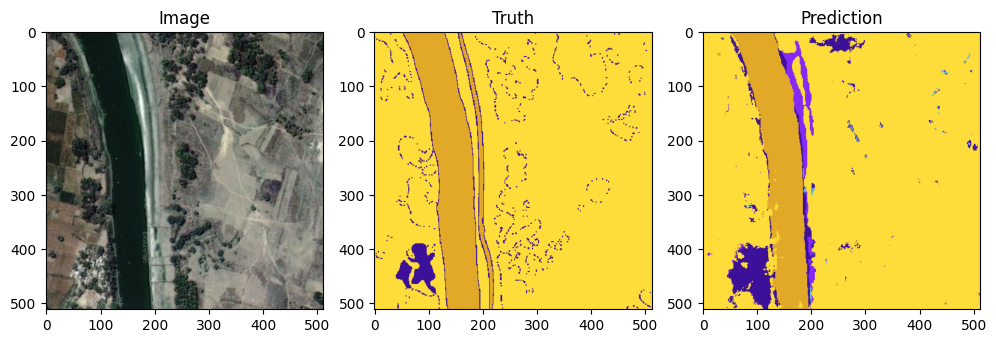

Accuracy: 0.9022 | Loss: 0.1352




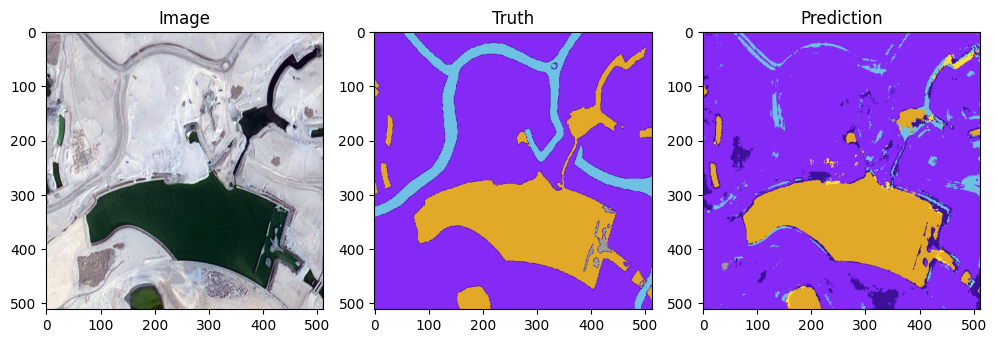

Accuracy: 0.8484 | Loss: 0.4495




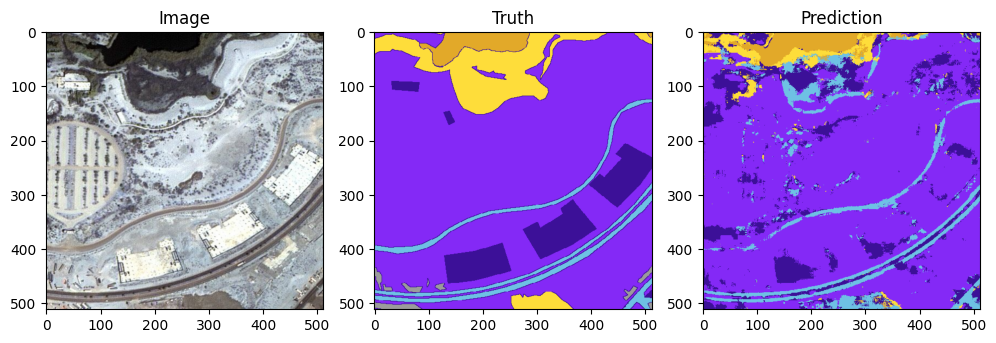

Accuracy: 0.7409 | Loss: 0.5202




In [18]:
test_acc_list = []

with torch.no_grad():
    for x, y in test_loader:
        x, y = x.to(device), y.to(device) # y: (b, h, w)
        y_pred = model(x) # y_pred: (b, 6, h, w)

        loss = criterion(y_pred, y)

        acc = compute_accuracy(y, y_pred, device)
        test_acc_list.append(acc.item())

        y_imgs = class_index_to_image(y, dataset.color_map, device)
        pred_imgs = one_hot_to_image(y_pred, dataset.color_map, device)
        plot_prediction(x, y_imgs, pred_imgs, dataset.color_map, mask_labels)

        print(f'Accuracy: {acc:.4f} | Loss: {loss:.4f}')
        print('\n')


In [19]:
mean_test_acc = np.mean(test_acc_list)
print(f'The mean test set accuracy is {mean_test_acc:.4f}')

The mean test set accuracy is 0.8054


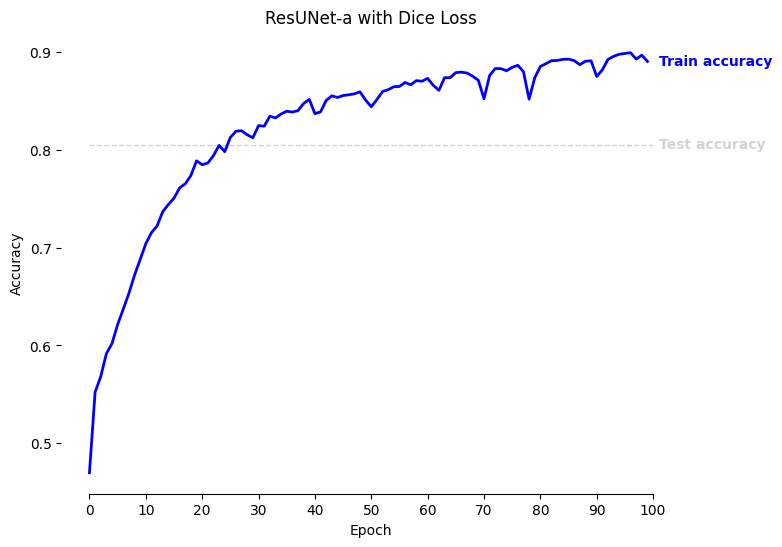

In [31]:
fig, ax = plt.subplots(figsize=(8, 6))

ax.plot(
    [0, 100], 
    [mean_test_acc, mean_test_acc],
    label="Test accuracy",
    color="lightgray",
    linestyle="--",
    linewidth=1,
)

ax.text(
    100 * 1.01,
    mean_test_acc,
    "Test accuracy",
    color="lightgray",
    fontweight="bold",
    horizontalalignment="left",
    verticalalignment="center",
)

ax.plot(
    acc_list,
    label="Train accuracy",
    color="blue",
    linewidth=2,
)

ax.text(
    100 * 1.01,
    acc_list[-1],
    "Train accuracy",
    color="blue",
    fontweight="bold",
    horizontalalignment="left",
    verticalalignment="center",
)

ax.spines["right"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.spines["top"].set_visible(False)

ax.yaxis.set_ticks_position("left")
ax.xaxis.set_ticks_position("bottom")
ax.spines["bottom"].set_bounds(0, 100)

ax.set_xticks(np.arange(0, 101, 10))

ax.set_xlabel("Epoch")
ax.set_ylabel("Accuracy")

plt.title('ResUNet-a with Dice Loss')
plt.show()